<a href="https://colab.research.google.com/github/AgentSmith7/SpeakerAI/blob/main/speaker_diarization_CallHome.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Speaker diarization is the process of dividing an audio stream containing human speech into homogeneous segments according to the identity of each speaker. These models aim to answer the question:  who spoke when? .

- pyannote is an open source toolkit for speaker diarization in python. It comes with state-of-the-art pretrained models and pipelines that are available on the Hugging Face Hub.

- pyannote/speaker-diarization-3.1 is the main pyannote pipeline used for speaker diarization. This system is explained in the paper Powerset multi-class cross entropy loss for neural speaker diarization (Alexis Plaquet and Hervé Bredin, 2023). It is based on several steps:

- First, it splits long conversations into shorter chunks.

- Second, it uses a  segmentation model , pyannote/segmentation-3.0, to perform speaker diarization at the chunk level.

- Finally, the segmented chunks are stitched back together using a  speaker embedding  model (pyannote/wespeaker-voxceleb-resnet34-LM) and a  clustering algorithm  (AgglomerativeClustering).

The segmentation model has been trained on a combination of datasets containing mostly English and Mandarin languages. As a consequence, the performance of the speaker diarization pipeline may decrease when confronted with out-of-distribution data, such as Spanish or Japanese.

In [ ]:
# 0️⃣ optional: reset environment if previous installs failed
#!pip uninstall -y numpy scipy torch torchvision torchaudio pyannote.audio

# 1️⃣ install stable NumPy & SciPy compatible with pyannote
#!pip install numpy==1.26.4 scipy==1.13.1

# 2️⃣ install PyTorch stack (CUDA 12.1 build)
#!pip install torch==2.3.1 torchvision==0.18.1 torchaudio==2.3.1 --index-url https://download.pytorch.org/whl/cu121

# 3️⃣ install pyannote.audio (v3 is latest stable for this torch)
#!pip install pyannote.audio==3.1.1

# 4️⃣ optional extras
#!pip install transformers==4.44.2 huggingface_hub==0.23.2 librosa==0.10.2.post1 ffmpeg-python

In [ ]:
# # 1️⃣ Downgrade NumPy back to 1.26.x (last 1.x release fully supported)
# !pip install numpy==1.26.4 --force-reinstall

# # 2️⃣ Reinstall SciPy for ABI consistency
# !pip install scipy==1.13.1 --force-reinstall

# # 3️⃣ Restart runtime after these two installs


In [ ]:
#!pip install numpy==1.26.4 scipy==1.13.1 --force-reinstall

In [ ]:
# !pip uninstall -y torchcodec

In [ ]:
import numpy as np
print(np.__version__)

1.26.4


In [ ]:
import torch, pyannote
from pyannote.audio import Pipeline

print("Torch:", torch.__version__)
print("GPU available:", torch.cuda.is_available())

import importlib.metadata
print("Pyannote:", importlib.metadata.version("pyannote.audio"))


/usr/local/lib/python3.12/dist-packages/pyannote/audio/core/io.py:43: UserWarning: torchaudio._backend.set_audio_backend has been deprecated. With dispatcher enabled, this function is no-op. You can remove the function call.
  torchaudio.set_audio_backend("soundfile")


Torch: 2.3.1+cu121
GPU available: True
Pyannote: 3.1.1


In [ ]:
# from pyannote.audio import Pipeline
# import torchaudio

# # 1️⃣ Download a short sample audio locally
# !wget -q -O sample.flac https://huggingface.co/datasets/Narsil/asr_dummy/resolve/main/1.flac

# # 2️⃣ Load pipeline
# pipeline = Pipeline.from_pretrained("pyannote/speaker-diarization-3.1")

# # 3️⃣ Run diarization on the local file
# output = pipeline("sample.flac")

# # 4️⃣ Display segments
# for turn, _, speaker in output.itertracks(yield_label=True):
#     print(f"{speaker}\t{turn.start:.1f}s → {turn.end:.1f}s")


In [ ]:
import pandas as pd
from datasets import Dataset, DatasetDict
import os
import glob

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

# Set up paths
import os
from pathlib import Path

# Define base paths
DRIVE_PATH = "/content/drive/MyDrive"
PROJECT_PATH = os.path.join(DRIVE_PATH, "speaker_ai")  # Adjust this to your actual folder name

# List contents to verify structure
print("=== Google Drive Structure ===")
print(f"Drive path: {DRIVE_PATH}")
print(f"Project path: {PROJECT_PATH}")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
=== Google Drive Structure ===
Drive path: /content/drive/MyDrive
Project path: /content/drive/MyDrive/speaker_ai


In [ ]:
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

Fri Nov  7 02:35:02 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA A100-SXM4-40GB          Off |   00000000:00:04.0 Off |                    0 |
| N/A   32C    P0             45W /  400W |       0MiB /  40960MiB |      0%      Default |
|                                         |                        |             Disabled |
+-----------------------------------------+-----

In [ ]:
# from huggingface_hub import notebook_login

# notebook_login()

In [ ]:
import os
from huggingface_hub import whoami

# Verify your token is working
print("Logged in as:", whoami(token=os.environ.get('HF_TOKEN')))

Logged in as: {'type': 'user', 'id': '649f4f858dae75ef400596f9', 'name': 'rishabh29288', 'fullname': 'rishabh', 'canPay': False, 'periodEnd': None, 'isPro': False, 'avatarUrl': '/avatars/f2e44f4e711cc087ed3d087a961179ba.svg', 'orgs': [], 'auth': {'type': 'access_token', 'accessToken': {'displayName': 'speaker_ai', 'role': 'fineGrained', 'createdAt': '2025-11-06T17:18:30.153Z', 'fineGrained': {'canReadGatedRepos': True, 'global': ['discussion.write', 'post.write'], 'scoped': [{'entity': {'_id': '621ffdc136468d709f17f137', 'type': 'model', 'name': 'pyannote/voice-activity-detection'}, 'permissions': ['repo.content.read', 'discussion.write', 'repo.write']}, {'entity': {'_id': '650d827e72afb1e60e8a8a6a', 'type': 'model', 'name': 'pyannote/segmentation-3.0'}, 'permissions': ['repo.content.read', 'discussion.write', 'repo.write']}, {'entity': {'_id': '6555d075325783cc791fb794', 'type': 'model', 'name': 'pyannote/speaker-diarization-3.1'}, 'permissions': ['repo.content.read', 'discussion.writ

In [ ]:
# !rm -rf ~/.cache/huggingface/datasets/talkbank__callhome*
# !rm -rf ~/.cache/huggingface/modules/datasets_modules/huggingface/talkbank__callhome*


In [ ]:
#!pip install --upgrade --force-reinstall datasets==3.0.2 fsspec==2024.6.1 huggingface_hub==0.25.2

In [ ]:
# # 1️⃣ Clean slate
# !pip uninstall -y datasets pyarrow fsspec

# # 2️⃣ Install the exact versions compatible with TalkBank Parquet builders + NumPy 1.x
# !pip install datasets==3.1.0 pyarrow==18.1.0 fsspec==2024.6.1

# # 3️⃣ Re-pin NumPy and SciPy for pyannote stability
# !pip install numpy==1.26.4 scipy==1.13.1 --force-reinstall


In [ ]:
import numpy, datasets, pyarrow
print("NumPy:", numpy.__version__)
print("datasets:", datasets.__version__)
print("pyarrow:", pyarrow.__version__)


NumPy: 1.26.4
datasets: 3.1.0
pyarrow: 18.1.0


In [ ]:
from datasets import load_dataset
ds_en = load_dataset("talkbank/callhome", "eng", trust_remote_code=True)
print(ds_en)

DatasetDict({
    data: Dataset({
        features: ['audio', 'timestamps_start', 'timestamps_end', 'speakers'],
        num_rows: 140
    })
})


In [ ]:
dataset = ds_en
dataset

DatasetDict({
    data: Dataset({
        features: ['audio', 'timestamps_start', 'timestamps_end', 'speakers'],
        num_rows: 140
    })
})

As we can see, this dataset contains four features:

- `audio`: Audio feature with audios samples at 16kHz.
- `speakers`: The list of audio speakers, with their order of appearance.
- `timestamps_start`: A list of timestamps indicating the start of each speaker segment.
- `timestamps_end`: A list of timestamps indicating the end of each speaker segment.

These are the features we want to have in our speaker diarisation dataset.


In [ ]:
#!pip install datasets[audio]==3.0.1

In [ ]:
from IPython.display import Audio, display
example = dataset["data"][0]

In [ ]:
print(display(Audio(example['audio']['array'], rate=example['audio']['sampling_rate'])))
print('Speakers: ', example['speakers'])
print('timestamps_start: ', example['timestamps_start'])
print('timestamps_end: ', example['timestamps_end'])

None
Speakers:  ['A', 'B', 'B', 'B', 'A', 'A', 'B', 'A', 'B', 'B', 'B', 'A', 'B', 'A', 'B', 'A', 'B', 'B', 'A', 'B', 'A', 'A', 'B', 'B', 'A', 'B', 'A', 'A', 'A', 'A', 'B', 'A', 'A', 'B', 'A', 'B', 'A', 'A', 'B', 'A', 'B', 'A', 'A', 'B', 'A', 'A', 'A', 'B', 'A', 'B', 'A', 'B', 'A', 'B', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'B', 'A', 'B', 'A', 'B', 'A', 'B', 'A', 'A', 'B', 'A', 'B', 'A', 'B', 'B', 'A', 'B', 'A', 'A', 'B', 'A', 'A', 'A', 'B', 'A', 'A', 'B', 'A', 'A', 'B', 'A', 'B', 'A', 'B', 'A', 'B', 'B', 'A', 'B', 'A', 'A', 'B', 'B', 'A', 'B', 'B']
timestamps_start:  [0.0, 6.070000000000164, 7.710000000000036, 10.259999999999991, 11.070000000000164, 12.710000000000036, 15.860000000000127, 16.600000000000136, 18.5300000000002, 23.920000000000073, 25.6400000000001, 27.360000000000127, 28.5, 30.470000000000027, 31.710000000000036, 33.340000000000146, 34.0, 37.97000000000003, 41.50999999999999, 42.2800000000002, 42.90000000000009, 43.61000000000013, 43.

As you can hear, there are two speakers in this conversation: A and B. The audio alternates between speakers A and B according to the timestamp start and end times. The speaker segments are quite short, typically lasting only a few seconds. This is typical of a conversational telephone dataset, like Callhome.

The Callhome dataset doesn't come with a predefined train-val-test split. Here, we use the `train_test_split` method from HF Datasets to split it with 80-10-10 proportion:

In [ ]:
from datasets import DatasetDict

train_testvalid = dataset['data'].train_test_split(test_size=0.2, seed=0)
test_valid = train_testvalid['test'].train_test_split(test_size=0.5, seed=0)

dataset = DatasetDict({
    'train': train_testvalid['train'],
    'validation': test_valid['test'],
    'test': test_valid['train']}
)

In [ ]:
dataset

DatasetDict({
    train: Dataset({
        features: ['audio', 'timestamps_start', 'timestamps_end', 'speakers'],
        num_rows: 112
    })
    validation: Dataset({
        features: ['audio', 'timestamps_start', 'timestamps_end', 'speakers'],
        num_rows: 14
    })
    test: Dataset({
        features: ['audio', 'timestamps_start', 'timestamps_end', 'speakers'],
        num_rows: 14
    })
})

# Load the pretrained model

Let's load the pretrained segmentation-model model we want to fine-tune. We can load the pre-trained weights from the Hugging Face Hub using the `.from_pretrained` method. We will use its configuration to know how we should preprocess our dataset.

In [ ]:
from pyannote.audio import Model

pretrained = Model.from_pretrained(
  "pyannote/segmentation-3.0",
  use_auth_token=True
)

To fine-tune the pretrained segmentation model with the Hugging Face Trainer, we need to export it to the `diarizers` modelling class `SegmentationModel`. This class is a convenient wrapper around the pyannote segmentation model that enables compatibility with the Trainer by ensuring the correct input arguments and returning the expected output format.


We can load `pyannote`'s pretrained model weights, architecture and configuration into a `SegmentationModel` using the next line of code:

In [ ]:
# Inlined SegmentationModel and dependencies from diarizers
import copy
from typing import Optional
from functools import lru_cache

import torch
import torch.nn as nn
import torch.nn.functional as F
from einops import rearrange
from pyannote.audio.core.task import Problem, Resolution, Specifications
from pyannote.audio.models.segmentation import PyanNet
from pyannote.audio.models.blocks.sincnet import SincNet
from pyannote.audio.utils.loss import binary_cross_entropy, nll_loss
from pyannote.audio.utils.permutation import permutate
from pyannote.audio.utils.powerset import Powerset
from pyannote.audio.utils.params import merge_dict
from pyannote.core.utils.generators import pairwise
from transformers import PretrainedConfig, PreTrainedModel


# Helper class for PyanNet_nn
class Dict(dict):
    def __init__(self, *args, **kwargs):
        super(Dict, self).__init__(*args, **kwargs)
        self.__dict__ = self


# PyanNet_nn class (adapted from pyannote)
class PyanNet_nn(torch.nn.Module):
    """PyanNet segmentation model adapted from PyanNet model used in pyannote.
    Inherits from nn.Module (no more dependency to pytorch Lightning)
    Doesn't need the task attribute anymore.

    SincNet > LSTM > Feed forward > Classifier
    """

    SINCNET_DEFAULTS = {"stride": 10}
    LSTM_DEFAULTS = {
        "hidden_size": 128,
        "num_layers": 4,
        "bidirectional": True,
        "monolithic": True,
        "dropout": 0.0,
    }
    LINEAR_DEFAULTS = {"hidden_size": 128, "num_layers": 2}

    def __init__(
        self,
        sincnet: Optional[dict] = None,
        lstm: Optional[dict] = None,
        linear: Optional[dict] = None,
        sample_rate: int = 16000,
        num_channels: int = 1,
    ):
        super(PyanNet_nn, self).__init__()

        sincnet = merge_dict(self.SINCNET_DEFAULTS, sincnet)
        sincnet["sample_rate"] = sample_rate
        lstm = merge_dict(self.LSTM_DEFAULTS, lstm)
        lstm["batch_first"] = True
        linear = merge_dict(self.LINEAR_DEFAULTS, linear)

        self.hparams = Dict(
            {
                "linear": {"hidden_size": 128, "num_layers": 2},
                "lstm": {
                    "hidden_size": 128,
                    "num_layers": 4,
                    "bidirectional": True,
                    "monolithic": True,
                    "dropout": 0.0,
                    "batch_first": True,
                },
                "num_channels": 1,
                "sample_rate": 16000,
                "sincnet": {"stride": 10, "sample_rate": 16000},
            }
        )

        self.sincnet = SincNet(**self.hparams.sincnet)

        monolithic = lstm["monolithic"]
        if monolithic:
            multi_layer_lstm = dict(lstm)
            del multi_layer_lstm["monolithic"]
            self.lstm = nn.LSTM(60, **multi_layer_lstm)

        else:
            num_layers = lstm["num_layers"]
            if num_layers > 1:
                self.dropout = nn.Dropout(p=lstm["dropout"])

            one_layer_lstm = dict(lstm)
            one_layer_lstm["num_layers"] = 1
            one_layer_lstm["dropout"] = 0.0
            del one_layer_lstm["monolithic"]

            self.lstm = nn.ModuleList(
                [
                    nn.LSTM(
                        60 if i == 0 else lstm["hidden_size"] * (2 if lstm["bidirectional"] else 1),
                        **one_layer_lstm,
                    )
                    for i in range(num_layers)
                ]
            )

        if linear["num_layers"] < 1:
            return

        lstm_out_features: int = self.hparams.lstm["hidden_size"] * (2 if self.hparams.lstm["bidirectional"] else 1)
        self.linear = nn.ModuleList(
            [
                nn.Linear(in_features, out_features)
                for in_features, out_features in pairwise(
                    [
                        lstm_out_features,
                    ]
                    + [self.hparams.linear["hidden_size"]] * self.hparams.linear["num_layers"]
                )
            ]
        )

    @property
    def dimension(self) -> int:
        """Dimension of output"""
        if isinstance(self.specifications, tuple):
            raise ValueError("PyanNet does not support multi-tasking.")

        if self.specifications.powerset:
            return self.specifications.num_powerset_classes
        else:
            return len(self.specifications.classes)

    def default_activation(
        self,
    ):
        if self.specifications.problem == Problem.BINARY_CLASSIFICATION:
            return nn.Sigmoid()

        elif self.specifications.problem == Problem.MONO_LABEL_CLASSIFICATION:
            return nn.LogSoftmax(dim=-1)

        elif self.specifications.problem == Problem.MULTI_LABEL_CLASSIFICATION:
            return nn.Sigmoid()
        else:
            msg = "TODO: implement default activation for other types of problems"
            raise NotImplementedError(msg)

    def build(self):
        if self.hparams.linear["num_layers"] > 0:
            in_features = self.hparams.linear["hidden_size"]
        else:
            in_features = self.hparams.lstm["hidden_size"] * (2 if self.hparams.lstm["bidirectional"] else 1)

        self.classifier = nn.Linear(in_features, self.dimension)
        self.activation = self.default_activation()

    @lru_cache
    def num_frames(self, num_samples: int) -> int:
        """Compute number of output frames for a given number of input samples"""
        return self.sincnet.num_frames(num_samples)

    def receptive_field_size(self, num_frames: int = 1) -> int:
        """Compute size of receptive field"""
        return self.sincnet.receptive_field_size(num_frames=num_frames)

    def receptive_field_center(self, frame: int = 0) -> int:
        """Compute center of receptive field"""
        return self.sincnet.receptive_field_center(frame=frame)

    def forward(self, waveforms: torch.Tensor) -> torch.Tensor:
        """Pass forward

        Parameters
        ----------
        waveforms : (batch, channel, sample)

        Returns
        -------
        scores : (batch, frame, classes)
        """
        outputs = self.sincnet(waveforms)

        if self.hparams.lstm["monolithic"]:
            outputs, _ = self.lstm(rearrange(outputs, "batch feature frame -> batch frame feature"))
        else:
            outputs = rearrange(outputs, "batch feature frame -> batch frame feature")
            for i, lstm in enumerate(self.lstm):
                outputs, _ = lstm(outputs)
                if i + 1 < self.hparams.lstm["num_layers"]:
                    outputs = self.dropout(outputs)

        if self.hparams.linear["num_layers"] > 0:
            for linear in self.linear:
                outputs = F.leaky_relu(linear(outputs))

        return self.activation(self.classifier(outputs))


# SegmentationModelConfig class
class SegmentationModelConfig(PretrainedConfig):
    """Config class associated with SegmentationModel model."""

    model_type = "pyannet"

    def __init__(
        self,
        chunk_duration=10,
        max_speakers_per_frame=2,
        max_speakers_per_chunk=3,
        min_duration=None,
        warm_up=(0.0, 0.0),
        weigh_by_cardinality=False,
        **kwargs,
    ):
        """Init method for the SegmentationModelConfig"""
        super().__init__(**kwargs)
        self.chunk_duration = chunk_duration
        self.max_speakers_per_frame = max_speakers_per_frame
        self.max_speakers_per_chunk = max_speakers_per_chunk
        self.min_duration = min_duration
        self.warm_up = warm_up
        self.weigh_by_cardinality = weigh_by_cardinality
        # For now, the model handles only 16000 Hz sampling rate
        self.sample_rate = 16000


# SegmentationModel class
class SegmentationModel(PreTrainedModel):
    """
    Wrapper class for the PyanNet segmentation model used in pyannote.
    Inherits from Pretrained model to be compatible with the HF Trainer.
    Can be used to train segmentation models to be used for the "SpeakerDiarisation Task" in pyannote.
    """

    config_class = SegmentationModelConfig

    def __init__(
        self,
        config=SegmentationModelConfig(),
    ):
        """init method"""
        super().__init__(config)

        self.model = PyanNet_nn(sincnet={"stride": 10})

        self.weigh_by_cardinality = config.weigh_by_cardinality
        self.max_speakers_per_frame = config.max_speakers_per_frame
        self.chunk_duration = config.chunk_duration
        self.min_duration = config.min_duration
        self.warm_up = config.warm_up
        self.max_speakers_per_chunk = config.max_speakers_per_chunk

        self.specifications = Specifications(
            problem=Problem.MULTI_LABEL_CLASSIFICATION
            if self.max_speakers_per_frame is None
            else Problem.MONO_LABEL_CLASSIFICATION,
            resolution=Resolution.FRAME,
            duration=self.chunk_duration,
            min_duration=self.min_duration,
            warm_up=self.warm_up,
            classes=[f"speaker#{i+1}" for i in range(self.max_speakers_per_chunk)],
            powerset_max_classes=self.max_speakers_per_frame,
            permutation_invariant=True,
        )
        self.model.specifications = self.specifications
        self.model.build()
        self.setup_loss_func()

    def forward(self, waveforms, labels=None, nb_speakers=None):
        """forward pass of the Pretrained Model."""
        prediction = self.model(waveforms.unsqueeze(1))
        batch_size, num_frames, _ = prediction.shape

        if labels is not None:
            weight = torch.ones(batch_size, num_frames, 1, device=waveforms.device)
            warm_up_left = round(self.specifications.warm_up[0] / self.specifications.duration * num_frames)
            weight[:, :warm_up_left] = 0.0
            warm_up_right = round(self.specifications.warm_up[1] / self.specifications.duration * num_frames)
            weight[:, num_frames - warm_up_right :] = 0.0

            if self.specifications.powerset:
                multilabel = self.model.powerset.to_multilabel(prediction)
                permutated_target, _ = permutate(multilabel, labels)

                permutated_target_powerset = self.model.powerset.to_powerset(permutated_target.float())
                loss = self.segmentation_loss(prediction, permutated_target_powerset, weight=weight)

            else:
                permutated_prediction, _ = permutate(labels, prediction)
                loss = self.segmentation_loss(permutated_prediction, labels, weight=weight)

            return {"loss": loss, "logits": prediction}

        return {"logits": prediction}

    def setup_loss_func(self):
        """setup the loss function is self.specifications.powerset is True."""
        if self.specifications.powerset:
            self.model.powerset = Powerset(
                len(self.specifications.classes),
                self.specifications.powerset_max_classes,
            )

    def segmentation_loss(
        self,
        permutated_prediction: torch.Tensor,
        target: torch.Tensor,
        weight: Optional[torch.Tensor] = None,
    ) -> torch.Tensor:
        """Permutation-invariant segmentation loss"""
        if self.specifications.powerset:
            # `clamp_min` is needed to set non-speech weight to 1.
            class_weight = torch.clamp_min(self.model.powerset.cardinality, 1.0) if self.weigh_by_cardinality else None
            seg_loss = nll_loss(
                permutated_prediction,
                torch.argmax(target, dim=-1),
                class_weight=class_weight,
                weight=weight,
            )
        else:
            seg_loss = binary_cross_entropy(permutated_prediction, target.float(), weight=weight)

        return seg_loss

    @classmethod
    def from_pyannote_model(cls, pretrained):
        """Copy the weights and architecture of a pre-trained Pyannote model."""
        # Initialize model:
        specifications = copy.deepcopy(pretrained.specifications)

        # Copy pretrained model hyperparameters:
        chunk_duration = specifications.duration
        max_speakers_per_frame = specifications.powerset_max_classes
        weigh_by_cardinality = False
        min_duration = specifications.min_duration
        warm_up = specifications.warm_up
        max_speakers_per_chunk = len(specifications.classes)

        config = SegmentationModelConfig(
            chunk_duration=chunk_duration,
            max_speakers_per_frame=max_speakers_per_frame,
            weigh_by_cardinality=weigh_by_cardinality,
            min_duration=min_duration,
            warm_up=warm_up,
            max_speakers_per_chunk=max_speakers_per_chunk,
        )

        model = cls(config)

        # Copy pretrained model weights:
        model.model.hparams = copy.deepcopy(pretrained.hparams)
        model.model.sincnet = copy.deepcopy(pretrained.sincnet)
        model.model.sincnet.load_state_dict(pretrained.sincnet.state_dict())
        model.model.lstm = copy.deepcopy(pretrained.lstm)
        model.model.lstm.load_state_dict(pretrained.lstm.state_dict())
        model.model.linear = copy.deepcopy(pretrained.linear)
        model.model.linear.load_state_dict(pretrained.linear.state_dict())
        model.model.classifier = copy.deepcopy(pretrained.classifier)
        model.model.classifier.load_state_dict(pretrained.classifier.state_dict())
        model.model.activation = copy.deepcopy(pretrained.activation)
        model.model.activation.load_state_dict(pretrained.activation.state_dict())

        return model

    def to_pyannote_model(self):
        """Convert the current model to a pyannote segmentation model for use in pyannote pipelines."""
        seg_model = PyanNet(sincnet={"stride": 10})
        seg_model.hparams.update(self.model.hparams)

        seg_model.sincnet = copy.deepcopy(self.model.sincnet)
        seg_model.sincnet.load_state_dict(self.model.sincnet.state_dict())

        seg_model.lstm = copy.deepcopy(self.model.lstm)
        seg_model.lstm.load_state_dict(self.model.lstm.state_dict())

        seg_model.linear = copy.deepcopy(self.model.linear)
        seg_model.linear.load_state_dict(self.model.linear.state_dict())

        seg_model.classifier = copy.deepcopy(self.model.classifier)
        seg_model.classifier.load_state_dict(self.model.classifier.state_dict())

        seg_model.activation = copy.deepcopy(self.model.activation)
        seg_model.activation.load_state_dict(self.model.activation.state_dict())

        seg_model.specifications = self.specifications

        return seg_model


# Now use the inlined SegmentationModel
model = SegmentationModel.from_pyannote_model(pretrained)

In [ ]:
model.config

SegmentationModelConfig {
  "chunk_duration": 10.0,
  "max_speakers_per_chunk": 3,
  "max_speakers_per_frame": 2,
  "min_duration": null,
  "model_type": "pyannet",
  "sample_rate": 16000,
  "transformers_version": "4.44.2",
  "warm_up": [
    0.0,
    0.0
  ],
  "weigh_by_cardinality": false
}

Among the interesting attributes, we can list:

- `chunk_duration`: specifies the audio chunk duration that the segmentation model can take as input. Default is 10.
- `max_speakers_per_chunk`: specifies the maximum number of speakers the model can predict on each audio chunk.
- `max_speakers_per_frame`: specifies the maximum number of speakers the model can predict at the same time on a given audio frame.

Now that we have the dataset and the pre-trained model we want to fine-tune our model on, we can pre-process the dataset to make it ready for training.

For this, we use the `Preprocess` class. We can instantiate a preprocessor by passing the model's config as input to `Preprocess`. The preprocessing is done so that:

- the input to the models are audio chunks of length `chunk_duration`.
- The segmentation labels to predict contain maximum `max_speakers_per_chunk` and `max_speakers_per_frame` speakers.  



In [ ]:
# Updated Preprocess class with fix for receptive_field access
import math
import numpy as np
import torch


class Preprocess:
    """Converts a HF dataset with the following features:
        - "audio": Audio feature.
        - "speakers": The list of audio speakers, with their order of appearance.
        - "timestamps_start": A list of timestamps indicating the start of each speaker segment.
        - "timestamps_end": A list of timestamps indicating the end of each speaker segment.
    to a preprocessed dataset ready to be used with the HF Trainer.
    """

    def __init__(
        self,
        config,
    ):
        """Preprocess init method."""
        self.chunk_duration = config.chunk_duration
        self.max_speakers_per_frame = config.max_speakers_per_frame
        self.max_speakers_per_chunk = config.max_speakers_per_chunk
        self.min_duration = config.min_duration
        self.warm_up = config.warm_up

        self.sample_rate = config.sample_rate
        self.model = SegmentationModel(config).to_pyannote_model()

        # Get the number of frames associated to a chunk:
        _, self.num_frames_per_chunk, _ = self.model(
            torch.rand((1, int(self.chunk_duration * self.sample_rate)))
        ).shape

    def get_labels_in_file(self, file):
        """Get speakers in file."""
        file_labels = []
        for i in range(len(file["speakers"][0])):
            if file["speakers"][0][i] not in file_labels:
                file_labels.append(file["speakers"][0][i])

        return file_labels

    def get_segments_in_file(self, file, labels):
        """Get segments in file."""
        file_annotations = []

        for i in range(len(file["timestamps_start"][0])):
            start_segment = file["timestamps_start"][0][i]
            end_segment = file["timestamps_end"][0][i]
            label = labels.index(file["speakers"][0][i])
            file_annotations.append((start_segment, end_segment, label))

        dtype = [("start", "<f4"), ("end", "<f4"), ("labels", "i1")]

        annotations = np.array(file_annotations, dtype)

        return annotations

    def get_chunk(self, file, start_time):
        """Method used to get an audio chunk from an audio file given a start_time."""
        sample_rate = file["audio"][0]["sampling_rate"]

        assert sample_rate == self.sample_rate

        end_time = start_time + self.chunk_duration
        start_frame = math.floor(start_time * sample_rate)
        num_frames_waveform = math.floor(self.chunk_duration * sample_rate)
        end_frame = start_frame + num_frames_waveform

        waveform = file["audio"][0]["array"][start_frame:end_frame]

        labels = self.get_labels_in_file(file)

        file_segments = self.get_segments_in_file(file, labels)

        chunk_segments = file_segments[(file_segments["start"] < end_time) & (file_segments["end"] > start_time)]

        # compute frame resolution:
        resolution = self.chunk_duration / self.num_frames_per_chunk

        # discretize chunk annotations at model output resolution
        # Try to get receptive field from model, fallback to resolution if not available
        try:
            step = self.model.receptive_field.step
            half = 0.5 * self.model.receptive_field.duration
        except AttributeError:
            # Fallback: use resolution-based approach
            step = resolution
            half = 0.5 * resolution

        # discretize chunk annotations at model output resolution
        start = np.maximum(chunk_segments["start"], start_time) - start_time - half
        start_idx = np.maximum(0, np.round(start / step)).astype(int)

        end = np.minimum(chunk_segments["end"], end_time) - start_time - half
        end_idx = np.round(end / step).astype(int)

        # get list and number of labels for current scope
        labels = list(np.unique(chunk_segments["labels"]))
        num_labels = len(labels)
        # initial frame-level targets
        y = np.zeros((self.num_frames_per_chunk, num_labels), dtype=np.uint8)

        # map labels to indices
        mapping = {label: idx for idx, label in enumerate(labels)}

        for start, end, label in zip(start_idx, end_idx, chunk_segments["labels"]):
            mapped_label = mapping[label]
            y[start : end + 1, mapped_label] = 1

        return waveform, y, labels

    def get_start_positions(self, file, overlap, random=False):
        """Get start positions from the audio_chunks in the input audio file."""
        sample_rate = file["audio"][0]["sampling_rate"]

        assert sample_rate == self.sample_rate

        file_duration = len(file["audio"][0]["array"]) / sample_rate
        start_positions = np.arange(0, file_duration - self.chunk_duration, self.chunk_duration * (1 - overlap))

        if random:
            nb_samples = int(file_duration / self.chunk_duration)
            start_positions = np.random.uniform(0, file_duration, nb_samples)

        return start_positions

    def __call__(self, file, random=False, overlap=0.0):
        """Chunk an audio file into short segments of duration self.chunk_duration"""
        new_batch = {"waveforms": [], "labels": [], "nb_speakers": []}

        if random:
            start_positions = self.get_start_positions(file, overlap, random=True)
        else:
            start_positions = self.get_start_positions(file, overlap)

        for start_time in start_positions:
            waveform, target, label = self.get_chunk(file, start_time)

            new_batch["waveforms"].append(waveform)
            new_batch["labels"].append(target)
            new_batch["nb_speakers"].append(label)

        return new_batch


# Re-instantiate the preprocessor with the fixed code
preprocessor = Preprocess(model.config)

/usr/local/lib/python3.12/dist-packages/asteroid_filterbanks/enc_dec.py:202: UserWarning: Input tensor was 2D. Applying the corresponding Decoder to the current output will result in a 3D tensor. This behaviours was introduced to match Conv1D and ConvTranspose1D, please use 3D inputs to avoid it. For example, this can be done with input_tensor.unsqueeze(1).
  warnings.warn(


We can now pre-process the `train` and `val` splits of the dataset using the `.map` function from 🤗 Datasets.

We can also specify whether we want to add overlap between successive audio chunks in each dataset. Here we will add 50% overlap (`0.5`) between successive examples in the train set and no overlap (`0`) in the val set:

In [ ]:
train_set = dataset['train'].map(
    lambda file: preprocessor(file, random=False, overlap=0.5),
    num_proc=2,
    remove_columns=next(iter(dataset.values())).column_names,
    batched=True,
    batch_size=1
).with_format("torch")

val_set = dataset['validation'].map(
    lambda file: preprocessor(file, random=False, overlap=0.0),
    num_proc=2,
    remove_columns=next(iter(dataset.values())).column_names,
    batched=True,
    batch_size=1
).with_format('torch')

Map (num_proc=2):   0%|          | 0/112 [00:00<?, ? examples/s]

Map (num_proc=2):   0%|          | 0/14 [00:00<?, ? examples/s]

The processed dataset contains 3 features:

- `waveforms`: The input to the model - a tensor array containing 10s audio chunk, sampled at 16000 Hz.
- `labels`: The target output of the model - a tensor with shape $(num\_frames, num\_speakers)$
- `nb_speakers`: The speakers in the current chunk - a tensor with shape (0, `nb_speakers`).

Let's listen to an example and visualize the corresponding labels:

In [ ]:
from IPython.display import Audio, display

example2 = train_set[5]

display(Audio(example2['waveforms'], rate = 16000))

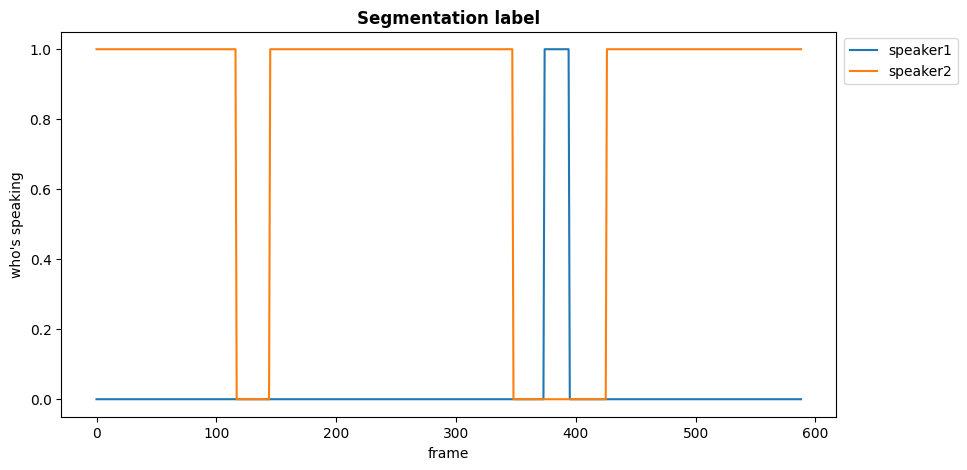

In [ ]:
import matplotlib.pyplot as plt

def plot_segmentation_labels(example):

  plt.figure(figsize = (10, 5))
  plt.plot(example2['labels'][:,0], label= 'speaker1')
  plt.plot(example2['labels'][:,1], label='speaker2')
  plt.legend(bbox_to_anchor=(1.001, 1.001))
  plt.xlabel('frame')
  plt.ylabel("who's speaking")
  plt.title('Segmentation label', fontweight="bold")
  plt.show()

plot_segmentation_labels(example2)

# Prepare Training

After preprocessing, each audio-chunk can have a different number of speakers: as a consequence, the segmentation labels won't have the same shapes `(num_frames, num_speakers)`.  

The DataCollator class below solves this issue by dynamically padding all target tensors to `max_speakers_per_chunk` during training. It handles two cases:

1. **More speakers than max**: If a chunk has more than `max_speakers_per_chunk` speakers, it keeps only the `max_speakers_per_chunk` most talkative ones (based on total speaking time).

2. **Fewer speakers than max**: If a chunk has fewer than `max_speakers_per_chunk` speakers, it pads with zeros (artificial inactive speakers).

This ensures all samples in a batch have the same shape `(num_frames, max_speakers_per_chunk)`, which is required for efficient batch processing during training.

In [ ]:
# Inlined DataCollator class from diarizers
import numpy as np
import torch


class DataCollator:
    """Data collator that will dynamically pad the target labels to have max_speakers_per_chunk"""

    def __init__(self, max_speakers_per_chunk) -> None:
        self.max_speakers_per_chunk = max_speakers_per_chunk

    def __call__(self, features):
        """
        Args:
            features: List of features from the dataset

        Returns:
            Collated batch with waveforms and padded labels
        """
        batch = {}

        speakers = [f["nb_speakers"] for f in features]
        labels = [f["labels"] for f in features]

        batch["labels"] = self.pad_targets(labels, speakers)

        batch["waveforms"] = torch.stack([f["waveforms"] for f in features])

        return batch

    def pad_targets(self, labels, speakers):
        """
        Pad target labels to max_speakers_per_chunk.

        Args:
            labels: List of label tensors
            speakers: List of speaker lists for each sample

        Returns:
            Collated target tensor of shape (batch_size, num_frames, max_speakers_per_chunk)
            If one chunk has more than max_speakers_per_chunk speakers, we keep
            the max_speakers_per_chunk most talkative ones. If it has less, we pad with
            zeros (artificial inactive speakers).
        """
        targets = []

        for i in range(len(labels)):
            label = speakers[i]
            target = labels[i].numpy()
            num_speakers = len(label)

            if num_speakers > self.max_speakers_per_chunk:
                indices = np.argsort(-np.sum(target, axis=0), axis=0)
                target = target[:, indices[: self.max_speakers_per_chunk]]

            elif num_speakers < self.max_speakers_per_chunk:
                target = np.pad(
                    target,
                    ((0, 0), (0, self.max_speakers_per_chunk - num_speakers)),
                    mode="constant",
                )

            targets.append(target)

        return torch.from_numpy(np.stack(targets))


# Instantiate the DataCollator
data_collator = DataCollator(max_speakers_per_chunk=model.config.max_speakers_per_chunk)

The Metrics class computes:
- DER (Diarization Error Rate): Overall error rate
- False Alarm Rate: Detected speech that isn't actually speech
- Missed Detection Rate: Actual speech that wasn't detected
- Confusion Rate: Speaker confusion errors

In [ ]:
# Inlined Metrics class from diarizers
import numpy as np
import torch
from pyannote.audio.torchmetrics import (DiarizationErrorRate, FalseAlarmRate,
                                         MissedDetectionRate,
                                         SpeakerConfusionRate)
from pyannote.audio.utils.powerset import Powerset


class Metrics:
    """Metric class used by the HF trainer to compute speaker diarization metrics."""

    def __init__(self, specifications) -> None:
        """init method

        Args:
            specifications: specifications attribute from a SegmentationModel.
        """
        self.powerset = specifications.powerset
        self.classes = specifications.classes
        self.powerset_max_classes = specifications.powerset_max_classes

        self.model_powerset = Powerset(
            len(self.classes),
            self.powerset_max_classes,
        )

        self.metrics = {
            "der": DiarizationErrorRate(0.5),
            "confusion": SpeakerConfusionRate(0.5),
            "missed_detection": MissedDetectionRate(0.5),
            "false_alarm": FalseAlarmRate(0.5),
        }

    def __call__(self, eval_pred):
        """
        Compute metrics from evaluation predictions.

        Args:
            eval_pred: Tuple of (logits, labels) from the trainer

        Returns:
            Dictionary with DER, false_alarm, missed_detection, and confusion metrics
        """
        logits, labels = eval_pred

        if self.powerset:
            predictions = self.model_powerset.to_multilabel(torch.tensor(logits))
        else:
            predictions = torch.tensor(logits)

        labels = torch.tensor(labels)

        predictions = torch.transpose(predictions, 1, 2)
        labels = torch.transpose(labels, 1, 2)

        metrics = {"der": 0, "false_alarm": 0, "missed_detection": 0, "confusion": 0}

        metrics["der"] += self.metrics["der"](predictions, labels).cpu().numpy()
        metrics["false_alarm"] += self.metrics["false_alarm"](predictions, labels).cpu().numpy()
        metrics["missed_detection"] += self.metrics["missed_detection"](predictions, labels).cpu().numpy()
        metrics["confusion"] += self.metrics["confusion"](predictions, labels).cpu().numpy()

        return metrics


# Instantiate the Metrics
metrics = Metrics(model.specifications)
print("Available metrics:", metrics.metrics)

Available metrics: {'der': DiarizationErrorRate(), 'confusion': SpeakerConfusionRate(), 'missed_detection': MissedDetectionRate(), 'false_alarm': FalseAlarmRate()}


- Automatically creates the project "speaker-diarization" if it doesn't exist
- Logs training metrics, evaluation metrics, and model checkpoints
- You can view everything in your WandB dashboard

Note: if one does not want to upload the model checkpoints to the Hub, set push_to_hub=False.

In [ ]:
print(f"Train set: {len(train_set)} samples")
print(f"Val set: {len(val_set)} samples")
print(f"Estimated batches per epoch: {len(train_set) // 32}")

Train set: 11580 samples
Val set: 690 samples
Estimated batches per epoch: 361


In [ ]:
# Simple approach: Just set the API key, let Trainer handle WandB
from transformers import TrainingArguments
import os
from google.colab import userdata

# Just set the API key - Trainer will initialize WandB
os.environ['WANDB_API_KEY'] = userdata.get('WANDB_API_KEY')

# Define training arguments
training_args = TrainingArguments(
    output_dir='./speaker-segmentation-fine-tuned-callhome-eng',
    save_strategy="epoch",
    save_total_limit=3,
    load_best_model_at_end=True,
    learning_rate=1e-3,
    num_train_epochs=5,
    lr_scheduler_type="cosine",
    per_device_train_batch_size=32,
    per_device_eval_batch_size=32,
    gradient_accumulation_steps=1,
    eval_strategy="epoch",
    dataloader_num_workers=2,
    dataloader_pin_memory=True,
    logging_steps=10,
    logging_dir="./logs",
    logging_first_step=True,
    report_to=[],  # Trainer will initialize WandB automatically
    run_name="speaker-segmentation-callhome-eng",
    seed=42,
    push_to_hub=False,
    fp16=False,
    dataloader_drop_last=False,
)

print("✅ Training arguments configured")
print("   WandB will be initialized automatically by Trainer")
print("=" * 60)

✅ Training arguments configured
   WandB will be initialized automatically by Trainer


In [ ]:
# Print all training arguments for verification
print("\n" + "=" * 60)
print("TRAINING ARGUMENTS SUMMARY:")
print("=" * 60)
print(f"Output directory: {training_args.output_dir}")
print(f"Learning rate: {training_args.learning_rate}")
print(f"Epochs: {training_args.num_train_epochs}")
print(f"Train batch size: {training_args.per_device_train_batch_size}")
print(f"Eval batch size: {training_args.per_device_eval_batch_size}")
print(f"Effective batch size: {training_args.per_device_train_batch_size * training_args.gradient_accumulation_steps}")
print(f"LR scheduler: {training_args.lr_scheduler_type}")
print(f"Evaluation strategy: {training_args.eval_strategy}")
print(f"Save strategy: {training_args.save_strategy}")
print(f"Logging steps: {training_args.logging_steps}")
print(f"Report to: {training_args.report_to}")
print(f"Seed: {training_args.seed}")
print(f"Push to Hub: {training_args.push_to_hub}")
print("=" * 60)

# Calculate estimated training time
train_samples = len(train_set)
batches_per_epoch = train_samples // training_args.per_device_train_batch_size
total_batches = batches_per_epoch * training_args.num_train_epochs
print(f"\nEstimated training:")
print(f"  Batches per epoch: {batches_per_epoch}")
print(f"  Total batches: {total_batches}")
print(f"  With logging every {training_args.logging_steps} steps, you'll see ~{batches_per_epoch // training_args.logging_steps} logs per epoch")
print("=" * 60)


TRAINING ARGUMENTS SUMMARY:
Output directory: ./speaker-segmentation-fine-tuned-callhome-eng
Learning rate: 0.001
Epochs: 5
Train batch size: 32
Eval batch size: 32
Effective batch size: 32
LR scheduler: SchedulerType.COSINE
Evaluation strategy: IntervalStrategy.EPOCH
Save strategy: IntervalStrategy.EPOCH
Logging steps: 10
Report to: []
Seed: 42
Push to Hub: False

Estimated training:
  Batches per epoch: 361
  Total batches: 1805
  With logging every 10 steps, you'll see ~36 logs per epoch


In [ ]:
# Create Trainer
from transformers import Trainer

print("\nCreating Trainer...")
trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=train_set,
    data_collator=data_collator,
    eval_dataset=val_set,
    compute_metrics=metrics,
)

print("✅ Trainer created successfully!")
print(f"   Model device: {next(model.parameters()).device}")
print(f"   Total parameters: {sum(p.numel() for p in model.parameters()):,}")
print(f"   Trainable parameters: {sum(p.numel() for p in model.parameters() if p.requires_grad):,}")
print("=" * 60)
print("\n🚀 Starting training now...")
print("   WandB will initialize automatically when training starts")
print("   You'll see progress updates every 10 steps")
print("   Estimated time: ~30-60 minutes for 5 epochs")
print("=" * 60)

# Start training - WandB will be initialized by Trainer
trainer.train()


Creating Trainer...
✅ Trainer created successfully!
   Model device: cuda:0
   Total parameters: 1,473,265
   Trainable parameters: 1,473,265

🚀 Starting training now...
   WandB will initialize automatically when training starts
   You'll see progress updates every 10 steps
   Estimated time: ~30-60 minutes for 5 epochs


Could not estimate the number of tokens of the input, floating-point operations will not be computed


Epoch,Training Loss,Validation Loss,Der,False Alarm,Missed Detection,Confusion
1,0.403200,0.472019,0.191176,0.059141,0.074873,0.057162
2,0.397700,0.466738,0.186952,0.062069,0.071619,0.053264
3,0.401200,0.461148,0.182473,0.062015,0.069613,0.050845
4,0.328800,0.466481,0.182198,0.058316,0.072045,0.051838
5,0.338600,0.465663,0.182306,0.059875,0.070893,0.051538


TrainOutput(global_step=1810, training_loss=0.3805305648574513, metrics={'train_runtime': 299.7862, 'train_samples_per_second': 193.138, 'train_steps_per_second': 6.038, 'total_flos': 0.0, 'train_loss': 0.3805305648574513, 'epoch': 5.0})

The Test class evaluates the model on full meeting recordings (not just chunks) at inference time, which is more realistic than the chunk-based evaluation during training

In [ ]:
# Convert model to pyannote format
model = model.to_pyannote_model()

# Inlined Test class from diarizers
import numpy as np
import torch
from pyannote.audio import Inference
from pyannote.audio.pipelines.utils import get_devices
from pyannote.audio.torchmetrics import (DiarizationErrorRate, FalseAlarmRate,
                                         MissedDetectionRate,
                                         SpeakerConfusionRate)
from pyannote.core import SlidingWindow, SlidingWindowFeature
from tqdm import tqdm


class Test:
    """Class used to evaluate a SegmentationModel at inference time on a given test set."""

    def __init__(self, test_dataset, model, step=2.5):
        """init method

        Args:
            test_dataset: Hugging Face speaker diarization test dataset
            model: SegmentationModel used at inference (in pyannote format).
            step (float, optional): Steps between successive generated audio chunks. Defaults to 2.5.
        """
        self.test_dataset = test_dataset
        self.model = model
        (self.device,) = get_devices(needs=1)
        self.inference = Inference(self.model, step=step, device=self.device)

        self.sample_rate = test_dataset[0]["audio"]["sampling_rate"]

        # Get the number of frames associated to a chunk:
        _, self.num_frames, _ = self.inference.model(
            torch.rand((1, int(self.inference.duration * self.sample_rate))).to(self.device)
        ).shape
        # compute frame resolution:
        self.resolution = self.inference.duration / self.num_frames

        self.metrics = {
            "der": DiarizationErrorRate(0.5).to(self.device),
            "confusion": SpeakerConfusionRate(0.5).to(self.device),
            "missed_detection": MissedDetectionRate(0.5).to(self.device),
            "false_alarm": FalseAlarmRate(0.5).to(self.device),
        }

    def predict(self, file):
        """Make a prediction on a dataset row, using pyannote inference object.

        Args:
            file: dataset row

        Returns:
            prediction: model prediction
        """
        audio = torch.tensor(file["audio"]["array"]).unsqueeze(0).to(torch.float32).to(self.device)
        sample_rate = file["audio"]["sampling_rate"]

        input = {"waveform": audio, "sample_rate": sample_rate}

        prediction = self.inference(input)

        return prediction

    def compute_gt(self, file):
        """
        Args:
            file: dataset row.

        Returns:
            gt: numpy array with shape (num_frames, num_speakers).
        """
        audio = torch.tensor(file["audio"]["array"]).unsqueeze(0).to(torch.float32)
        sample_rate = file["audio"]["sampling_rate"]

        audio_duration = len(audio[0]) / sample_rate
        num_frames = int(round(audio_duration / self.resolution))

        labels = list(set(file["speakers"]))

        gt = np.zeros((num_frames, len(labels)), dtype=np.uint8)

        for i in range(len(file["timestamps_start"])):
            start = file["timestamps_start"][i]
            end = file["timestamps_end"][i]
            speaker = file["speakers"][i]
            start_frame = int(round(start / self.resolution))
            end_frame = int(round(end / self.resolution))
            speaker_index = labels.index(speaker)

            gt[start_frame:end_frame, speaker_index] += 1

        return gt

    def compute_metrics_on_file(self, file):
        """Compute and update metrics on a dataset row.

        Args:
            file: a Hugging Face dataset row.
        """
        gt = self.compute_gt(file)
        prediction = self.predict(file)

        sliding_window = SlidingWindow(start=0, step=self.resolution, duration=self.resolution)
        labels = list(set(file["speakers"]))

        reference = SlidingWindowFeature(data=gt, labels=labels, sliding_window=sliding_window)

        for window, pred in prediction:
            reference_window = reference.crop(window, mode="center")
            common_num_frames = min(self.num_frames, reference_window.shape[0])

            _, ref_num_speakers = reference_window.shape
            _, pred_num_speakers = pred.shape

            if pred_num_speakers > ref_num_speakers:
                reference_window = np.pad(reference_window, ((0, 0), (0, pred_num_speakers - ref_num_speakers)))
            elif ref_num_speakers > pred_num_speakers:
                pred = np.pad(pred, ((0, 0), (0, ref_num_speakers - pred_num_speakers)))

            pred = torch.tensor(pred[:common_num_frames]).unsqueeze(0).permute(0, 2, 1).to(self.device)
            target = (torch.tensor(reference_window[:common_num_frames]).unsqueeze(0).permute(0, 2, 1)).to(self.device)

            self.metrics["der"](pred, target)
            self.metrics["false_alarm"](pred, target)
            self.metrics["missed_detection"](pred, target)
            self.metrics["confusion"](pred, target)

    def compute_metrics(self):
        """Main method, used to compute speaker diarization metrics on test_dataset.
        Returns:
            dict: metric values.
        """
        for file in tqdm(self.test_dataset):
            self.compute_metrics_on_file(file)

        return {
            "der": self.metrics["der"].compute().cpu().item(),
            "false_alarm": self.metrics["false_alarm"].compute().cpu().item(),
            "missed_detection": self.metrics["missed_detection"].compute().cpu().item(),
            "confusion": self.metrics["confusion"].compute().cpu().item(),
        }


# Now use the Test class
print("Creating Test instance...")
test = Test(dataset['test'], model, step=2.5)

print("Computing metrics on test set...")
print("This will evaluate the model on full meeting recordings at inference time.")
print("=" * 60)

metrics = test.compute_metrics()

print("\n" + "=" * 60)
print("TEST SET METRICS (Inference Time):")
print("=" * 60)
print(f"DER (Diarization Error Rate): {metrics['der']:.4f} ({metrics['der']*100:.2f}%)")
print(f"False Alarm Rate: {metrics['false_alarm']:.4f} ({metrics['false_alarm']*100:.2f}%)")
print(f"Missed Detection Rate: {metrics['missed_detection']:.4f} ({metrics['missed_detection']*100:.2f}%)")
print(f"Confusion Rate: {metrics['confusion']:.4f} ({metrics['confusion']*100:.2f}%)")
print("=" * 60)

/usr/local/lib/python3.12/dist-packages/pyannote/audio/pipelines/speaker_verification.py:43: UserWarning: torchaudio._backend.get_audio_backend has been deprecated. With dispatcher enabled, this function is no-op. You can remove the function call.
  backend = torchaudio.get_audio_backend()
DEBUG:speechbrain.utils.checkpoints:Registered checkpoint save hook for _speechbrain_save
DEBUG:speechbrain.utils.checkpoints:Registered checkpoint load hook for _speechbrain_load
DEBUG:speechbrain.utils.checkpoints:Registered checkpoint save hook for save
DEBUG:speechbrain.utils.checkpoints:Registered checkpoint load hook for load
DEBUG:speechbrain.utils.checkpoints:Registered checkpoint save hook for _save
DEBUG:speechbrain.utils.checkpoints:Registered checkpoint load hook for _recover
/usr/local/lib/python3.12/dist-packages/pyannote/audio/pipelines/speaker_verification.py:45: UserWarning: Module 'speechbrain.pretrained' was deprecated, redirecting to 'speechbrain.inference'. Please update your scr

Creating Test instance...
Computing metrics on test set...
This will evaluate the model on full meeting recordings at inference time.


  0%|          | 0/14 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/pyannote/audio/utils/reproducibility.py:74: ReproducibilityWarning: TensorFloat-32 (TF32) has been disabled as it might lead to reproducibility issues and lower accuracy.
It can be re-enabled by calling
   >>> import torch
   >>> torch.backends.cuda.matmul.allow_tf32 = True
   >>> torch.backends.cudnn.allow_tf32 = True
See https://github.com/pyannote/pyannote-audio/issues/1370 for more details.

  warnings.warn(
100%|██████████| 14/14 [00:33<00:00,  2.37s/it]


TEST SET METRICS (Inference Time):
DER (Diarization Error Rate): 0.1786 (17.86%)
False Alarm Rate: 0.0726 (7.26%)
Missed Detection Rate: 0.0670 (6.70%)
Confusion Rate: 0.0390 (3.90%)


In [ ]:
# Use in a pyannote speaker diarization pipeline
import torch
from pyannote.audio import Pipeline

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

# Load the pre-trained diarization pipeline
print("\nLoading pre-trained pyannote speaker diarization pipeline...")
pipeline = Pipeline.from_pretrained("pyannote/speaker-diarization-3.1")
pipeline.to(device)

# Override the segmentation model with our fine-tuned checkpoint
print("Replacing segmentation model with fine-tuned model...")
pipeline._segmentation.model = model.to(device)
print("✅ Fine-tuned model loaded into pipeline!")

print("=" * 60)

# Run the speaker diarization pipeline on a full meeting example
example = dataset['test'][0]

print(f"\nExample from test set:")
print(f"  Number of speakers in file: {len(set(example['speakers']))}")

# Prepare input for the pipeline
sample = {}
sample["waveform"] = torch.from_numpy(example['audio']["array"]).to(device, dtype=model.dtype).unsqueeze(0)
sample["sample_rate"] = example['audio']['sampling_rate']

print(f"  Audio duration: {len(example['audio']['array']) / sample['sample_rate']:.2f} seconds")
print(f"  Sample rate: {sample['sample_rate']} Hz")

# Perform inference
print("\nRunning speaker diarization pipeline...")
print("  (This may take a moment for full-length audio)")
diarization = pipeline(sample, num_speakers=2)

print("\n✅ Diarization complete!")
print("=" * 60)

# Display the diarization results
print("\nDiarization Results:")
print(diarization)

# Save to RTTM format
output_file = "audio.rttm"
with open(output_file, "w") as rttm:
    diarization.write_rttm(rttm)

print(f"\n✅ Results saved to: {output_file}")
print("=" * 60)

# Optional: Display some statistics
print("\nDiarization Statistics:")
for turn, _, speaker in diarization.itertracks(yield_label=True):
    print(f"  Speaker {speaker}: {turn.start:.2f}s - {turn.end:.2f}s (duration: {turn.duration:.2f}s)")

Using device: cuda

Loading pre-trained pyannote speaker diarization pipeline...
Replacing segmentation model with fine-tuned model...
✅ Fine-tuned model loaded into pipeline!

Example from test set:
  Number of speakers in file: 2
  Audio duration: 300.26 seconds
  Sample rate: 16000 Hz

Running speaker diarization pipeline...
  (This may take a moment for full-length audio)


/usr/local/lib/python3.12/dist-packages/pyannote/audio/models/blocks/pooling.py:104: UserWarning: std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at ../aten/src/ATen/native/ReduceOps.cpp:1807.)
  std = sequences.std(dim=-1, correction=1)



✅ Diarization complete!

Diarization Results:
[ 00:00:00.008 -->  00:00:03.709] A SPEAKER_00
[ 00:00:02.130 -->  00:00:03.302] B SPEAKER_01
[ 00:00:04.303 -->  00:00:14.626] C SPEAKER_00
[ 00:00:07.054 -->  00:00:07.410] D SPEAKER_01
[ 00:00:14.966 -->  00:00:24.762] E SPEAKER_00
[ 00:00:25.509 -->  00:00:28.208] F SPEAKER_01
[ 00:00:29.719 -->  00:00:30.178] G SPEAKER_00
[ 00:00:30.738 -->  00:00:31.366] H SPEAKER_01
[ 00:00:32.368 -->  00:00:32.843] I SPEAKER_00
[ 00:00:33.641 -->  00:00:34.558] J SPEAKER_01
[ 00:00:34.762 -->  00:00:37.020] K SPEAKER_01
[ 00:00:38.684 -->  00:00:42.334] L SPEAKER_00
[ 00:00:42.555 -->  00:00:43.641] M SPEAKER_01
[ 00:00:42.741 -->  00:00:43.675] N SPEAKER_00
[ 00:00:44.745 -->  00:00:45.407] O SPEAKER_00
[ 00:00:45.492 -->  00:00:48.769] P SPEAKER_01
[ 00:00:48.989 -->  00:00:50.755] Q SPEAKER_01
[ 00:00:50.110 -->  00:00:54.049] R SPEAKER_00
[ 00:00:51.825 -->  00:00:52.809] S SPEAKER_01
[ 00:00:54.473 -->  00:00:55.577] T SPEAKER_01
[ 00:00:54.89

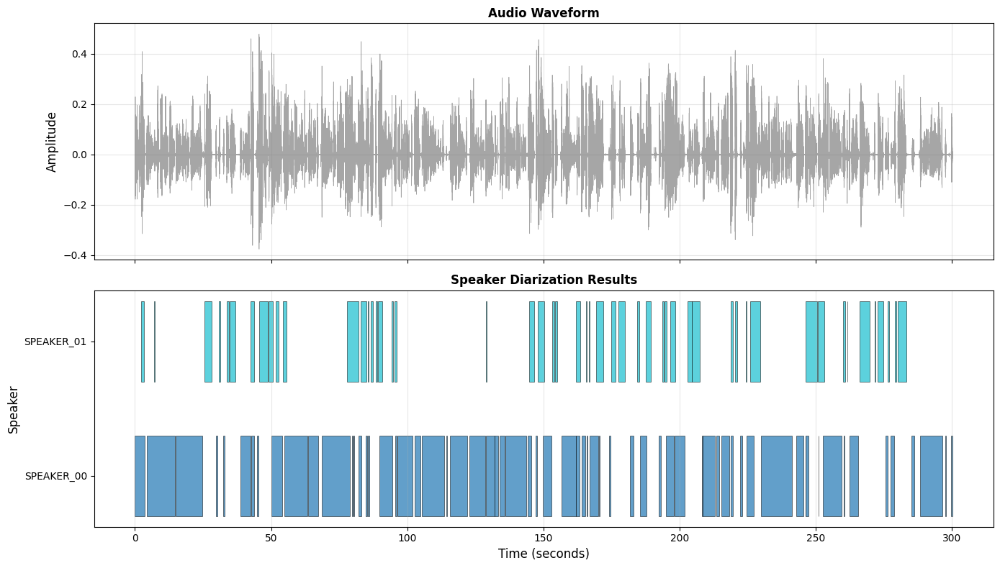

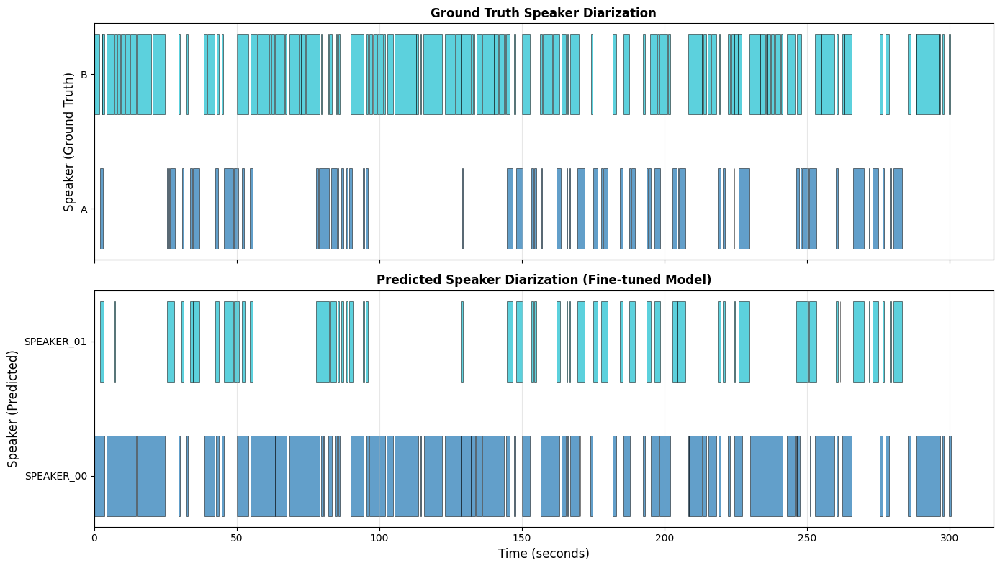


Diarization Summary:
Total duration: 300.25 seconds
Number of speaker turns: 116

Speaking time per speaker:
  SPEAKER_00: 185.89s (61.9%)
  SPEAKER_01: 76.66s (25.5%)


In [ ]:
# Simple visualization using matplotlib only
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import numpy as np
from pyannote.core import Segment

# Get audio data
audio_array = example['audio']['array']
sample_rate = example['audio']['sampling_rate']
duration = len(audio_array) / sample_rate
time_axis = np.linspace(0, duration, len(audio_array))

# Create figure with waveform and diarization
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(14, 8), sharex=True)

# Plot audio waveform
ax1.plot(time_axis, audio_array, linewidth=0.5, alpha=0.7, color='gray')
ax1.set_ylabel('Amplitude', fontsize=12)
ax1.set_title('Audio Waveform', fontsize=12, fontweight='bold')
ax1.grid(True, alpha=0.3)

# Plot diarization manually
speakers = sorted(set([speaker for _, _, speaker in diarization.itertracks(yield_label=True)]))
colors = plt.cm.tab10(np.linspace(0, 1, len(speakers)))
speaker_to_color = {speaker: colors[i] for i, speaker in enumerate(speakers)}

y_positions = {speaker: i for i, speaker in enumerate(speakers)}

for turn, _, speaker in diarization.itertracks(yield_label=True):
    ax2.barh(y_positions[speaker], turn.duration, left=turn.start,
             height=0.6, color=speaker_to_color[speaker], alpha=0.7, edgecolor='black', linewidth=0.5)

ax2.set_yticks(range(len(speakers)))
ax2.set_yticklabels(speakers)
ax2.set_xlabel('Time (seconds)', fontsize=12)
ax2.set_ylabel('Speaker', fontsize=12)
ax2.set_title('Speaker Diarization Results', fontsize=12, fontweight='bold')
ax2.grid(True, alpha=0.3, axis='x')

plt.tight_layout()
plt.show()

# Create ground truth annotation for comparison
ground_truth = {}
for i in range(len(example['timestamps_start'])):
    start = example['timestamps_start'][i]
    end = example['timestamps_end'][i]
    speaker = example['speakers'][i]
    if speaker not in ground_truth:
        ground_truth[speaker] = []
    ground_truth[speaker].append((start, end))

# Create side-by-side comparison
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(14, 8), sharex=True)

# Plot ground truth
gt_speakers = sorted(ground_truth.keys())
gt_colors = plt.cm.tab10(np.linspace(0, 1, len(gt_speakers)))
gt_speaker_to_color = {speaker: gt_colors[i] for i, speaker in enumerate(gt_speakers)}
gt_y_positions = {speaker: i for i, speaker in enumerate(gt_speakers)}

for speaker in gt_speakers:
    for start, end in ground_truth[speaker]:
        ax1.barh(gt_y_positions[speaker], end - start, left=start,
                height=0.6, color=gt_speaker_to_color[speaker], alpha=0.7,
                edgecolor='black', linewidth=0.5)

ax1.set_yticks(range(len(gt_speakers)))
ax1.set_yticklabels(gt_speakers)
ax1.set_ylabel('Speaker (Ground Truth)', fontsize=12)
ax1.set_title('Ground Truth Speaker Diarization', fontsize=12, fontweight='bold')
ax1.grid(True, alpha=0.3, axis='x')

# Plot predicted diarization
for turn, _, speaker in diarization.itertracks(yield_label=True):
    ax2.barh(y_positions[speaker], turn.duration, left=turn.start,
             height=0.6, color=speaker_to_color[speaker], alpha=0.7,
             edgecolor='black', linewidth=0.5)

ax2.set_yticks(range(len(speakers)))
ax2.set_yticklabels(speakers)
ax2.set_xlabel('Time (seconds)', fontsize=12)
ax2.set_ylabel('Speaker (Predicted)', fontsize=12)
ax2.set_title('Predicted Speaker Diarization (Fine-tuned Model)', fontsize=12, fontweight='bold')
ax2.grid(True, alpha=0.3, axis='x')

plt.tight_layout()
plt.show()

# Print summary statistics
print("\n" + "=" * 60)
print("Diarization Summary:")
print("=" * 60)
print(f"Total duration: {diarization.get_timeline().extent().duration:.2f} seconds")
print(f"Number of speaker turns: {len(list(diarization.itertracks()))}")

# Count speaking time per speaker
speaker_times = {}
for turn, _, speaker in diarization.itertracks(yield_label=True):
    if speaker not in speaker_times:
        speaker_times[speaker] = 0
    speaker_times[speaker] += turn.duration

print("\nSpeaking time per speaker:")
for speaker, duration in sorted(speaker_times.items()):
    percentage = (duration / diarization.get_timeline().extent().duration) * 100
    print(f"  {speaker}: {duration:.2f}s ({percentage:.1f}%)")

print("=" * 60)

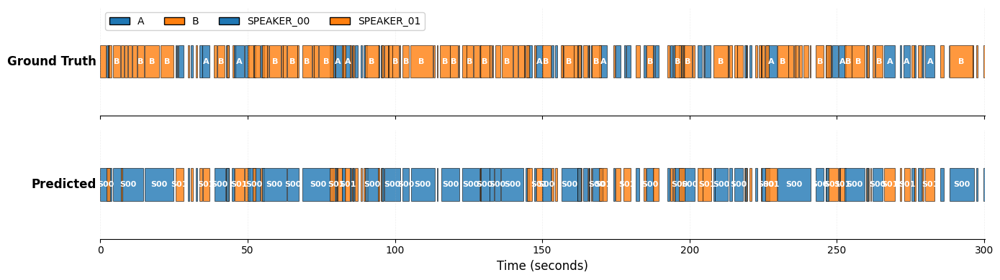

In [ ]:
# Enhanced timeline with speaker labels
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import numpy as np

# Get audio duration
audio_array = example['audio']['array']
sample_rate = example['audio']['sampling_rate']
duration = len(audio_array) / sample_rate

# Create ground truth segments
ground_truth_segments = {}
for i in range(len(example['timestamps_start'])):
    start = example['timestamps_start'][i]
    end = example['timestamps_end'][i]
    speaker = example['speakers'][i]
    if speaker not in ground_truth_segments:
        ground_truth_segments[speaker] = []
    ground_truth_segments[speaker].append((start, end))

# Get all speakers
all_speakers_gt = sorted(set(example['speakers']))
all_speakers_pred = sorted(set([speaker for _, _, speaker in diarization.itertracks(yield_label=True)]))
all_speakers = sorted(set(all_speakers_gt + all_speakers_pred))

# Color mapping
color_map = {
    'SPEAKER_00': '#1f77b4',  # Blue
    'SPEAKER_01': '#ff7f0e',  # Orange
}
for i, speaker in enumerate(all_speakers):
    if speaker not in color_map:
        color_map[speaker] = plt.cm.tab10(i % 10)

# Create figure
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(14, 4), sharex=True)

# Track 1: Ground Truth
ax1.set_xlim(0, duration)
ax1.set_ylim(-0.5, 0.5)
ax1.set_yticks([])
ax1.set_ylabel('Ground Truth', fontsize=12, fontweight='bold', rotation=0, ha='right', va='center')
ax1.spines['top'].set_visible(False)
ax1.spines['right'].set_visible(False)
ax1.spines['left'].set_visible(False)
ax1.spines['bottom'].set_visible(True)

for speaker in all_speakers_gt:
    if speaker in ground_truth_segments:
        for start, end in ground_truth_segments[speaker]:
            width = end - start
            if width > 2:  # Only label segments longer than 2 seconds
                ax1.barh(0, width, left=start, height=0.3,
                        color=color_map.get(speaker, 'gray'), alpha=0.8,
                        edgecolor='black', linewidth=0.5)
                # Add speaker label for longer segments
                ax1.text(start + width/2, 0, speaker.replace('SPEAKER_', 'S'),
                        ha='center', va='center', fontsize=8, fontweight='bold',
                        color='white' if color_map.get(speaker, 'gray') != 'white' else 'black')
            else:
                ax1.barh(0, width, left=start, height=0.3,
                        color=color_map.get(speaker, 'gray'), alpha=0.8,
                        edgecolor='black', linewidth=0.5)

# Track 2: Predicted
ax2.set_xlim(0, duration)
ax2.set_ylim(-0.5, 0.5)
ax2.set_yticks([])
ax2.set_ylabel('Predicted', fontsize=12, fontweight='bold', rotation=0, ha='right', va='center')
ax2.set_xlabel('Time (seconds)', fontsize=12)
ax2.spines['top'].set_visible(False)
ax2.spines['right'].set_visible(False)
ax2.spines['left'].set_visible(False)
ax2.spines['bottom'].set_visible(True)

for turn, _, speaker in diarization.itertracks(yield_label=True):
    width = turn.duration
    if width > 2:  # Only label segments longer than 2 seconds
        ax2.barh(0, width, left=turn.start, height=0.3,
                color=color_map.get(speaker, 'gray'), alpha=0.8,
                edgecolor='black', linewidth=0.5)
        # Add speaker label
        ax2.text(turn.start + width/2, 0, speaker.replace('SPEAKER_', 'S'),
                ha='center', va='center', fontsize=8, fontweight='bold',
                color='white' if color_map.get(speaker, 'gray') != 'white' else 'black')
    else:
        ax2.barh(0, width, left=turn.start, height=0.3,
                color=color_map.get(speaker, 'gray'), alpha=0.8,
                edgecolor='black', linewidth=0.5)

# Legend
legend_elements = [mpatches.Patch(facecolor=color_map.get(speaker, 'gray'),
                                   edgecolor='black', label=speaker)
                   for speaker in all_speakers]
ax1.legend(handles=legend_elements, loc='upper left', ncol=len(all_speakers),
           frameon=True, fontsize=10, framealpha=0.9)

# Grid
for ax in [ax1, ax2]:
    ax.grid(True, alpha=0.2, axis='x', linestyle='--', linewidth=0.5)
    ax.set_xticks(np.arange(0, duration + 1, max(50, int(duration/12))))

plt.tight_layout()
plt.show()